# Family Tree Charts for person ID 1

## Imports

In [17]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
from matplotlib.image import imread
import pandas as pd
import numpy as np
import PIL
from PIL import Image, ImageDraw, ImageFont
import math
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from geopy.geocoders import Nominatim
import time
PIL.Image.MAX_IMAGE_PIXELS = None

# import config #separate .py file where I have private data stored
import exampleconfig as config

## Functions

In [18]:
def getarchfontsize(fontfile,text,w,h):
    #Used for arc font in occupation pie chart
    #Checks both text width and text heigh fits within given width (w) and height (h)
    textratio = 0.95
    fontsize = 1
    font = ImageFont.truetype(fontfile, fontsize)
    while font.getsize(text)[0] < w*textratio and font.getsize(text)[1] < h*textratio:
        fontsize += 1
        font = ImageFont.truetype(fontfile, fontsize)
    
    fontsize -= 1
    font = ImageFont.truetype(fontfile, fontsize)
    return font

## Set person so that correct settings loaded from config

In [19]:
person0id = 'Rachel' #ID of person to set as focus for family tree
personsettings = config.personsettings[person0id]

filedir = config.filedirectory
fontfile = filedir + '\\Fonts\\Redressed\\Redressed-Regular.ttf'

## Ancestry Pie Chart

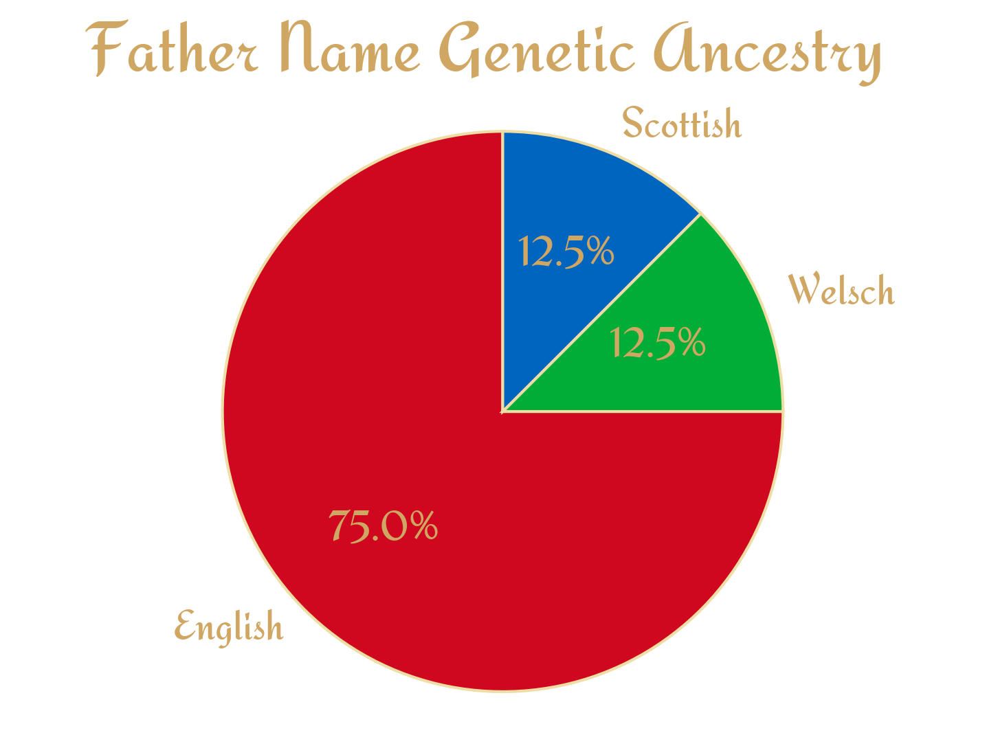

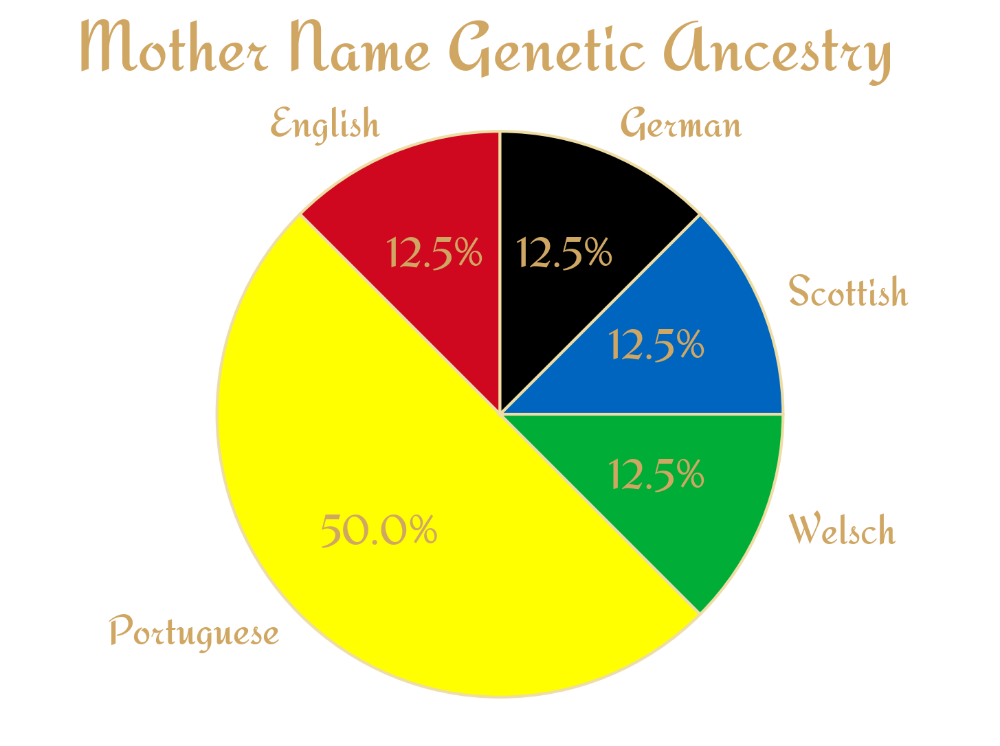

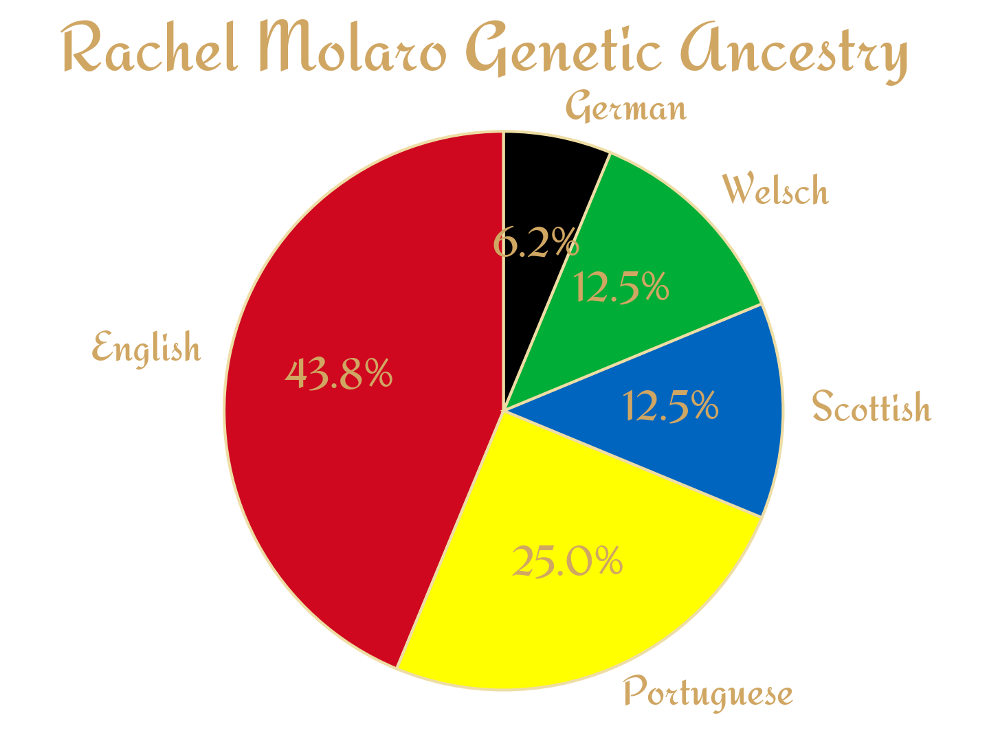

In [20]:
#######################################
# Creates pie chart of genetic ancestry
#######################################
# Percentages are hand entered for this chart (not being pulled from database)


# country color dictionary
# Values are set to flag colors for the countries here
ccd = {}
ccdn = {}
ccdn['?'] = (100,100,100)
ccdn['USA'] = (60,59,110)
ccdn['Canada'] = (255,255,255) #for red (255,0,0)
ccdn['England'] = (207,8,31)
ccdn['Portugal'] = (255,255,0) #for yellow (255,255,0)
ccdn['Wales'] = (0,173,54)
ccdn['Germany'] = (0,0,0)
ccdn['Scotland'] = (0,101,191)

# some of the charts need the r,g,b values scale of 0-255, some need 0-1 so a dictionary of each type is made
for c in ccdn:
    cr = ccdn[c][0]
    cg = ccdn[c][1]
    cb = ccdn[c][2]
    ccd[c] = (cr/255,cg/255,cb/255)
    
# font size and color settings
fontsize = 15
fontsize_title = 25

textcolor = (208,166,99)
textcolornorm = (208/255,166/255,99/255)
prop = fm.FontProperties(fname=fontfile,size=fontsize)
proptitle = fm.FontProperties(fname=fontfile,size=fontsize_title)

textprops = {}
textprops['color']=textcolornorm
textprops['fontsize']=fontsize
textprops['fontproperties']=prop

# color for edge of pie slices
edgecolor = (238/255,221/255,164/255)
    
####Father1 Genetic Ancestry Chart
labels = ['English','Welsch','Scottish']
colors = [ccd['England'],ccd['Wales'],ccd['Scotland']]
sizes = [6/8,1/8,1/8,]
fig1, ax1 = plt.subplots(dpi=300)
ax1.pie(sizes,labels=labels,colors=colors,autopct='%1.1f%%',shadow=False,textprops=textprops,startangle=90,wedgeprops={'edgecolor':edgecolor})
ax1.axis('equal')

plt.suptitle(f'{config.father1name} Genetic Ancestry',fontproperties=proptitle,color=textcolornorm)
# plt.show()
fig1.savefig('fathergeneticpie.png',transparent = True,bbox_inches='tight')

####Mother1 Genetic Ancestry Chart
labels = ['English','Portuguese','Welsch','Scottish','German']
colors = [ccd['England'],ccd['Portugal'],ccd['Wales'],ccd['Scotland'],ccd['Germany']]
sizes = [1/8,4/8,1/8,1/8,1/8]
fig1, ax1 = plt.subplots(dpi=300)
ax1.pie(sizes,labels=labels,colors=colors,autopct='%1.1f%%',shadow=False,textprops=textprops,startangle=90,wedgeprops={'edgecolor':edgecolor})
ax1.axis('equal')
plt.suptitle(f'{config.mother1name} Genetic Ancestry',fontproperties=proptitle,color=textcolornorm)
# plt.show()
fig1.savefig('mothergeneticpie.png',transparent = True,bbox_inches='tight')

####Person1 Genetic Ancestry Chart
labels = ['English','Portuguese', 'Scottish','Welsch','German']
colors = [ccd['England'],ccd['Portugal'],ccd['Scotland'],ccd['Wales'],ccd['Germany']]
sizes = [7/16, 1/4, 1/8, 1/8, 1/16]
fig1, ax1 = plt.subplots(dpi=300)
ax1.pie(sizes,labels=labels,colors=colors,autopct='%1.1f%%',textprops=textprops,startangle=90,wedgeprops={'edgecolor':edgecolor})
ax1.axis('equal')
plt.suptitle(f'{config.person1name} Genetic Ancestry',fontproperties=proptitle,color=textcolornorm)
# plt.show()
fig1.savefig('persongeneticpie.png',transparent = True,bbox_inches='tight')

## Birth Location Chart

In [21]:
##########################################
# BirthLocation by Generation Chart 
##########################################
# Creates type of fan/ring/pie chart (not sure what the official name is) with concentric rings outward for each generation
# up. Colored based on country of birth. 
# Reads data from Excel sheet
dfa = pd.read_excel('ancestor.xlsx',engine='openpyxl')


# Create blank image from array and set to be able to draw on it
r = 300 #dpi
array = np.zeros([6*r, 9*r, 4], dtype=np.uint8)
im2 = Image.fromarray(array)
d = ImageDraw.Draw(im2)

# bounding coordinates of chart
x0_0 = 0
y0_0 = 0
x1_0 = 1800
y1_0 = 1800
# linewidge of segments drawn
width = 1
# dimension to reduce size for each generation (thickness of ring)
# for less generations you could increase the sizereduce or could change the x1_0,y1_0 bounding box
sizereduce = 100
#set color of outline
outline = (50,50,50) 

# loop through generations
for i in range(0,9):
    # start with outermost generation
    gen = 9-i
    # arcs drawn maximum size for largest generation, then reduced for each generation down
    x0 = x0_0+sizereduce*i
    x1 = x1_0-sizereduce*i
    y0 = y0_0+sizereduce*i
    y1 = y1_0-sizereduce*i
    
    
    # filter and only use data from association ID 1 for My data
    # You could do this without 'association' filtering if you just had 1 database set up for the charts you want
    # I am using my database to draw charts for both myself and my daughter, so for my charts, I filter out my husband's
    # ancestors, for example. 
    # Filter by generation tag to only include data from the generation you're currently looking at
    dfm = dfa[(dfa['assoc']==1) & (dfa['genup']==gen)]
    data = dfm['birthcountry'].tolist()
    data = [x for x in data if str(x) != 'nan']
    
    # arc angle will depend on how many people in generation
    total_people = 2**(gen-1)
    arc = 360/total_people
    
    # Draw pie slice for each ancestor with the correct color based on the birth country
    for j,ancestor in enumerate(data):
        fill = ccdn[ancestor]
        start = j*arc
        end = j*arc + arc
        d.pieslice([(x0,y0),(x1,y1)],start,end,fill=fill,outline=outline, width=width)

# Draw key to the side of the ring chart
fontsize = 120
fnt = ImageFont.truetype(fontfile, fontsize)

# Divide vertical height of chart evenly by number of country colors
numcols = 0
for c in ccdn:
    numcols +=1
bh = (y1_0-y0_0)/numcols #box height

# Loop through countries/colors and add flag image, color rectangle, and text of country name
n = 0
for c in ccdn:
    if c != '?':
        flagfile = filedir + '\\Flags\\Square\\' + c + '.png'
    else:
        flagfile = filedir + '\\Flags\\Square\\unknown.png'
    flagpic = Image.open(flagfile)
    flagpic = flagpic.resize((int(bh*0.9),int(bh*0.9)))
    w,h = flagpic.size
    im2.paste(flagpic,((int(x1_0+bh),int(y0_0+n*bh))))

    d.rectangle([(x1_0+100,y0_0+n*bh),(x1_0+200,y0_0+n*bh + 0.9*bh)],fill=ccdn[c],outline=(0,0,0),width=1)
    if c == '?':
        ctext = 'Unknown'
    else:
        ctext = c
    d.text((x1_0+450,y0_0+n*bh+0.5*bh), ctext, font=fnt, fill=textcolor, anchor='lm')
    n+=1  
im2.save('ancbirthpie.png',transparent=True)  # Save the modified pixels as .png
im2.show()
im2.close()


## Occupation Chart

In [10]:
##########################################
# Occupation by Generation Chart 
##########################################
# Creates type of concentric ring chart, colored and labeled based on ancestor's occupation
# Code mostly functions the same as birth country chart above, Code differences have comments

# Reads data from Excel sheet
dfa = pd.read_excel('ancestor.xlsx',engine='openpyxl')

# Occupation categories and colors
# I didn't use the ones commented out below, but they could easily be included 
ccprof = {}
ccprof['?'] = (100,100,100) 
ccprof['Homemaker'] = (0,0,0) 
ccprof['Agriculture, Food, & Natural Resources'] = (23,77,37) 
ccprof['Architecture & Construction'] = (110,27,4) 
ccprof['Arts, Audio/Video Technology, & Communications'] = (87,36,94) 
ccprof['Finance'] = (37,71,140)
ccprof['Government & Public Administration'] = (163,65,72)
ccprof['Health Science'] =  (92,63,23)
ccprof['Human Services'] =    (4,110,96) 
ccprof['Information Technology'] = (13, 125, 2) 
ccprof['Manufacturing'] = (209,50,14) 
ccprof['Marketing, Sales, & Service'] = (152,78,163)
ccprof['Science, Technology, Engineering, & Mathematics'] = (55,126,184) 
ccprof['Transportation, Distribution, & Logistics'] = (161,117,57)
# ccprof['Business Management & Administration'] = (255,0,0) 
# ccprof['Education & Training'] = (255,0,0) 
# ccprof['Hospitality & Tourism'] = (255,0,0)
# ccprof['Law, Public Safety, Corrections, & Security'] = (255,0,0) 

# Create blank image from array and set to be able to draw on it
r = 300 #dpi
array = np.zeros([6*r, 9*r, 4], dtype=np.uint8)
im2 = Image.fromarray(array)
d = ImageDraw.Draw(im2)

x0_0 = 0
y0_0 = 0
x1_0 = 1800
y1_0 = 1800
fill = (255,0,0)
outline = (50,50,50)
width = 1
sizereduce = 150

fnt = ImageFont.truetype(fontfile, 40)

# Loop through generations to draw all the pieslice/rings
for i in range(0,6):
    x0 = x0_0+sizereduce*i
    x1 = x1_0-sizereduce*i
    y0 = y0_0+sizereduce*i
    y1 = y1_0-sizereduce*i
    
    gen = 5-i
    # filter and only use data from association ID 1,3,and 4 to include me and my two siblings
    # this creates an a-typical center rings with 3 people instead of just 1
    dfm = dfa[(dfa['assoc'].isin([1,3,4])) & (dfa['genup']==gen)]
    data = dfm['occupation'].tolist()
    data = [x for x in data if str(x) != 'nan']
    total_people = 2**(gen-1)
    if gen==1:
        total_people = 3
    arc = 360/total_people
    for j,occ in enumerate(data):
        occtype, occtext = occ.split(' % ')
        fill = ccprof[occtype]
        start = j*arc
        end = j*arc + arc
        d.pieslice([(x0,y0),(x1,y1)],start,end,fill=fill,outline=outline, width=width)
        
# Loop through all the generations again to draw the text
for i in range(0,6):
    x0 = x0_0+sizereduce*i
    x1 = x1_0-sizereduce*i
    y0 = y0_0+sizereduce*i
    y1 = y1_0-sizereduce*i
    
    gen = 5-i
    #filter and only use data from association ID 1 , 3, 4
    dfm = dfa[(dfa['assoc'].isin([1,3,4])) & (dfa['genup']==gen)]
    data = dfm['occupation'].tolist()
    data = [x for x in data if str(x) != 'nan']
    total_people = 2**(gen-1)
    if gen==1:
        total_people = 3
    arc = 360/total_people
    
    # Loop through occupation list for given generation
    for j,occ in enumerate(data):
        # The occupation type and the occupation description are split by a ' % ' symbol in the original database
        # The occupation type occtype must match one of the dictionary of occupations
        occtype, occtext = occ.split(' % ')
        fill = ccprof[occtype]
        start = j*arc
        end = j*arc + arc
        
        
        # Some text has been split, delimted by a ' $$ ' symbol in the original databse to force a line split for longer
        # occupation descriptions, or multiple occupations
        
        # for multi line occupation text
        if '$$' in occtext:
            textlist = occtext.split('$$')
        #for single line occupation text
        else:
            textlist = [occtext]
        
        
        for k,text in enumerate(textlist):
            if start>180:
                l = (x1-x0)/2-(sizereduce/(1+len(textlist)))*(k+1)
            else:
                l = (x1-x0)/2-(sizereduce/(1+len(textlist)))*(len(textlist)-k)
            arclen = math.radians(end-start)*l
            
            #figure out font size to use based on arclenth and height of ring
            fnt = getarchfontsize(fontfile,text,arclen,sizereduce/len(textlist)*0.9)
            
            # center text based on fontsize, so start slightly off of arc start
            tlen = fnt.getsize(text)[0]
            arcstart = j*arc+arc-math.degrees((arclen-tlen)/l)/2
            
            
            # text face up whether on top or bottom, so flip order of text placement (starting with beginning or end
            # of string) depending on which side of the circle you're writing on
            # This code writes a single character from the string onto a blank image
            # it rotates the image by the rotation degree for that character, then pastes it onto the main image
            if arcstart > 180:
                for t in reversed(text):
                    
                    tw, th = fnt.getsize(t)
                    arcend = arcstart - math.degrees(tw/l)
                    arcmid = arcend+(arcstart-arcend)/2
                    image2 = Image.new('RGBA', (tw, th), (0, 0, 0, 0))
                    draw2 = ImageDraw.Draw(image2)
                    draw2.text((0, 0), text=t, font=fnt, fill=textcolor)

                    rot = 360-(arcmid)

                    #if text on top half of circle or on bottom half, but text ends in top half    
                    if (rot <=180) or (rot>180 and start<180):
                        image2 = image2.rotate(180-(arcmid-90), expand=1)
                    else:
                        image2 = image2.rotate(360-(arcmid-90), expand=1)
                    sx, sy = image2.size

                    px = int(x0+(x1-x0)/2+math.cos(math.radians(rot))*l-sx/2)
                    py = int(y0+(y1-y0)/2-math.sin(math.radians(rot))*l-sy/2)
                    im2.paste(image2, (px, py, px + sx, py + sy), image2)

                    arcstart = arcend
            else:
                for t in text:
                    tw, th = fnt.getsize(t)
                    arcend = arcstart - math.degrees(tw/l)
                    arcmid = arcend+(arcstart-arcend)/2
                    image2 = Image.new('RGBA', (tw, th), (0, 0, 128, 0))
                    draw2 = ImageDraw.Draw(image2)
                    draw2.text((0, 0), text=t, font=fnt, fill=textcolor)

                    rot = 360-(arcmid)

                    if rot <=180:
                        image2 = image2.rotate(180-(arcmid-90), expand=1)
                    else:
                        image2 = image2.rotate(360-(arcmid-90), expand=1)
                    sx, sy = image2.size

                    px = int(x0+(x1-x0)/2+math.cos(math.radians(rot))*l-sx/2)
                    py = int(y0+(y1-y0)/2-math.sin(math.radians(rot))*l-sy/2)
                    im2.paste(image2, (px, py, px + sx, py + sy), image2)

                    arcstart = arcend

# Draw key to the side of the ring chart
fontsize = 60
fnt = ImageFont.truetype(fontfile, fontsize)

# Divide vertical height of chart evenly by number of country colors
numcols = 0
for c in ccprof:
    numcols +=1
bh = (y1_0-y0_0)/numcols #box height

# Loop through occupation categories and create color rectangle, paste little occupation image, and write text
# description of occupation. Some are manually written to be different than the dictionary key because I wanted
# them to be multiline or abbreviated to fit. 
n = 0
for c in ccprof:
    if c == 'Arts, Audio/Video Technology, & Communications':
        occfile = filedir + '\\Occupations\\Arts, AudioVideo Technology, & Communications.jpg'
    elif c != '?':
        occfile = filedir + '\\Occupations\\' + c + '.jpg'
    else:
        occfile = filedir + '\\Flags\\Square\\unknown.png'
    occpic = Image.open(occfile)
    occpic = occpic.resize((int(bh*0.7),int(bh*0.7)))
    w,h = occpic.size
    im2.paste(occpic,((int(x1_0+25+bh),int(y0_0+n*bh+.1*bh))))
    d.rectangle([(x1_0+50,y0_0+n*bh),(x1_0+150,y0_0+n*bh + 0.9*bh)],fill=ccprof[c],outline=(0,0,0),width=1)
    if c == '?':
        ctext = 'Unknown'
    else:
        if c=='Agriculture, Food, & Natural Resources':
            ctext = 'Agriculture, Food, \n & Natural Resources'
        elif c=='Arts, Audio/Video Technology, & Communications':
            ctext = 'Arts, Audio/Video Tech., \n & Communications'
        elif c=='Government & Public Administration':
            ctext = 'Government \n & Public Administration'
        elif c=='Science, Technology, Engineering, & Mathematics':
            ctext = 'Science, Technology, \n Engineering, & Mathematics'
        elif c=='Transportation, Distribution, & Logistics':
            ctext = 'Transportation, Distribution, \n & Logistics'
        else:
            ctext = c

    d.multiline_text((x1_0+250,y0_0+n*bh+0.5*bh), ctext, font=fnt, fill=textcolor, anchor='lm')
    n+=1  
im2.save('occupationpie.png',transparent=True)  # Save the modified pixels as .png

im2.show()
im2.close()

## Age At Marriage by Generation

In [11]:
##########################################
# Age at marriage by Generation Chart 
##########################################
# Creates type of concentric ring chart, colored and labeled based on ancestor's age at marriage and gender
# Code mostly functions the same as birth country chart above, so not commented much below

dfa = pd.read_excel('ancestor.xlsx',engine='openpyxl')

array = np.zeros([6*r, 9*r, 4], dtype=np.uint8)
im2 = Image.fromarray(array)

#######add lines
d = ImageDraw.Draw(im2)

x0_0 = 0
y0_0 = 0
x1_0 = 1800
y1_0 = 1800
fill = (255,0,0)
outline = (0,0,0)
outline = (238,221,164)
outline = (50,50,50)
width = 1
sizereduce = 100

cyd = {}
cydn = {}
cyd['?'] = (100,100,100)
cyd['> 30 yrs men'] = (177, 181, 218)
cyd['> 20 yrs men'] = (146, 160, 231)
cyd['> 17 yrs men'] = (105, 139, 243)
cyd['> 0 yrs men'] = (0, 119, 255)
cyd['> 30 yrs women'] = (215, 173, 174)
cyd['> 20 yrs women'] = (221, 141, 145)
cyd['> 17 yrs women'] = (223, 107, 117)
cyd['> 0 yrs women'] = (222, 66, 91)

for i in range(0,9):
    x0 = x0_0+sizereduce*i
    x1 = x1_0-sizereduce*i
    y0 = y0_0+sizereduce*i
    y1 = y1_0-sizereduce*i
    
    gen = 9-i
    #filter and only use data from association ID 1 for Rachel's data
    dfm = dfa[(dfa['assoc']==1) & (dfa['genup']==gen)]
    bdata = dfm['birthyear'].tolist()
    ddata = dfm['marriageyear'].tolist()
    gdata = dfm['gender'].tolist()

    data = []
    for by, my, g in zip(bdata,ddata,gdata):
        if str(by)=='nan' or str(my)=='nan':
            data.append([None,g])
        else:
            data.append([my-by,g])
    total_people = 2**(gen-1)
    arc = 360/total_people
#     print(data)
    for j,agedata in enumerate(data):
        age = agedata[0]
        gender = agedata[1]
        if age == None:
            fill = cyd['?']
        elif age >= 30 and gender=='male':
            fill = cyd['> 30 yrs men']
        elif age >= 20 and gender=='male':
            fill = cyd['> 20 yrs men']
        elif age >= 17 and gender=='male':
            fill = cyd['> 17 yrs men']
        elif age < 17 and gender=='male':
            fill = cyd['> 0 yrs men']
        elif age >= 30 and gender=='female':
            fill = cyd['> 30 yrs women']
        elif age >= 20 and gender=='female':
            fill = cyd['> 20 yrs women']
        elif age >= 17 and gender=='female':
            fill = cyd['> 17 yrs women']
        elif age < 17 and gender=='female':
            fill = cyd['> 0 yrs women']
        else:
            print('warning years',years)
            
        start = j*arc
        end = j*arc + arc
        d.pieslice([(x0,y0),(x1,y1)],start,end,fill=fill,outline=outline, width=width)

fontsize = 120
fnt = ImageFont.truetype(fontfile, fontsize)
n = 0
numcols = 0
for c in cyd:
    numcols +=1
bh = (y1_0-y0_0)/numcols #box height
for c in cyd:
    d.rectangle([(x1_0+100,y0_0+n*bh),(x1_0+200,y0_0+n*bh + 0.9*bh)],fill=cyd[c],outline=(0,0,0),width=1)
    if c == '?':
        ctext = 'Unknown'
    else:
        ctext = c
    d.text((x1_0+250,y0_0+n*bh+0.5*bh), ctext, font=fnt, fill=textcolor, anchor='lm')
    n+=1  
im2.save('agemarriedlivedpie.png',transparent=True)  # Save the modified pixels as .png
im2.show()
im2.close()

## Years Lived by Generation

In [12]:
##########################################
# Years lived by Generation Chart 
##########################################
# Creates type of concentric ring chart, colored and labeled based on ancestor's number of years lived
# Code mostly functions the same as birth country chart above, so not commented much below


dfa = pd.read_excel('ancestor.xlsx',engine='openpyxl')

array = np.zeros([6*r, 9*r, 4], dtype=np.uint8)
im2 = Image.fromarray(array)

#######add lines
d = ImageDraw.Draw(im2)

x0_0 = 0
y0_0 = 0
x1_0 = 1800
y1_0 = 1800
fill = (255,0,0)
outline = (0,0,0)
outline = (238,221,164)
outline = (50,50,50)
width = 1
sizereduce = 100

cyd = {}
cydn = {}
cyd['?'] = (100,100,100)
cyd['Living'] = (241, 241, 241)
cyd['> 100 yrs'] = (72, 143, 49)
cyd['> 80 yrs'] = (131, 175, 112)
cyd['> 60 yrs'] = (186, 208, 175)
cyd['> 40 yrs'] = (240, 184, 184)
cyd['> 20 yrs'] = (230, 127, 131)
cyd['> 0 yrs'] = (222, 66, 91)

for i in range(0,9):
    x0 = x0_0+sizereduce*i
    x1 = x1_0-sizereduce*i
    y0 = y0_0+sizereduce*i
    y1 = y1_0-sizereduce*i
    
    gen = 9-i
    #filter and only use data from association ID 1 for Rachel's data
    dfm = dfa[(dfa['assoc'] == 1) & (dfa['genup']==gen)]
    bdata = dfm['birthyear'].tolist()
    ddata = dfm['deathyear'].tolist()
#     data = [d-b for b,d in zip(bdata,ddata) if (str(b) != 'nan' and str(d) != 'nan')]
    data = []
    for by, dy in zip(bdata,ddata):
        if str(by)=='nan' or str(dy)=='nan':
            data.append(None)
        elif str(dy)=='living':
            data.append('living')
        else:
            data.append(dy-by)
    total_people = 2**(gen-1)
    arc = 360/total_people
#     print(data)
    for j,years in enumerate(data):
        if years == None:
            fill = cyd['?']
        elif years == 'living':
            fill = cyd['Living']
        elif years >= 100:
            fill = cyd['> 100 yrs']
        elif years >= 80:
            fill = cyd['> 80 yrs']
        elif years >= 60:
            fill = cyd['> 60 yrs']
        elif years >= 40:
            fill = cyd['> 40 yrs']
        elif years >= 20:
            fill = cyd['> 20 yrs']
        elif years < 20:
            fill = cyd['> 0 yrs']
        else:
            print('warning years',years)
            
        start = j*arc
        end = j*arc + arc
        d.pieslice([(x0,y0),(x1,y1)],start,end,fill=fill,outline=outline, width=width)

fontsize = 120
fnt = ImageFont.truetype(fontfile, fontsize)
n = 0
numcols = 0
for c in cyd:
    numcols +=1
bh = (y1_0-y0_0)/numcols #box height
for c in cyd:
    d.rectangle([(x1_0+100,y0_0+n*bh),(x1_0+200,y0_0+n*bh + 0.9*bh)],fill=cyd[c],outline=(0,0,0),width=1)
    if c == '?':
        ctext = 'Unknown'
    else:
        ctext = c
    d.text((x1_0+250,y0_0+n*bh+0.5*bh), ctext, font=fnt, fill=textcolor, anchor='lm')
    n+=1  
im2.save('yearslivedpie.png',transparent=True)  # Save the modified pixels as .png
im2.show()
im2.close()

## Maps

In [13]:
###############################
#Load Map Data
###############################
dfa = pd.read_excel('ancestor.xlsx',engine='openpyxl')


####get geolocation data for ancestor movement
# data is read from all generations and latitude/longitude data is gathered using an api call to geolocator
movelist = []
geolocator = Nominatim(user_agent=config.geolocatoremail)
# Example address
# location = geolocator.geocode("175 5th Avenue NYC")
# print(location.address)
# print((location.latitude, location.longitude))
# print(location.raw)

for gen in range(0,9):   
    print(gen)
    #filter and only use data from association ID 1, 3, and 4 
    dfm = dfa[(dfa['assoc'].isin([1,3,4])) & (dfa['genup']==gen)]
    data = dfm['movement'].tolist()
    byear = dfm['birthyear'].tolist()
    bloc = dfm['birthlocation'].tolist()
    dloc = dfm['deathlocation'].tolist()
    
    # Movement data either in form of year (meaning year estimate they moved from birth location to death location)
    # or given as details in the form (location 1; location 2; year; notes about move)
    # if there is more than one movement recorded for a person it is separated by '%%' in the excel sheet text
    for i,m in enumerate(data):
        if str(m) != 'nan':
            if isinstance(m,int):
                loc1 = bloc[i]
                loc2 = dloc[i]
                datemove = m
                descmove = ''
                location1 = geolocator.geocode(loc1)
                lat1 = location1.latitude
                lon1 = location1.longitude
                time.sleep(1.1)
                location2 = geolocator.geocode(loc2)
                lat2 = location2.latitude
                lon2 = location2.longitude
                time.sleep(1.1)
#                 print(lat1,lon1,lat2,lon2,datemove,descmove,(1,0,0),loc1, loc2,location1,location2)
                movelist.append([lat1,lon1,lat2,lon2,datemove,descmove,(1,0,0),loc1, loc2,location1,location2])
            else:
                mtotdata = m.split('%%')
                for md in mtotdata:
                    mdata = md.split(';')
                    if len(mdata) == 1:
                        print(mdata)
                    elif len(mdata) == 3:
                        loc1, loc2, datemove = md.split(';')
                        descmove = ''
                    elif len(mdata) == 4:
                        loc1, loc2, datemove, descmove = md.split(';')
                    print(loc1)
                    location1 = geolocator.geocode(loc1)
                    lat1 = location1.latitude
                    lon1 = location1.longitude
                    time.sleep(1.1)
                    print(loc2)
                    location2 = geolocator.geocode(loc2)
                    lat2 = location2.latitude
                    lon2 = location2.longitude
                    time.sleep(1.1)
#                     print(lat1,lon1,lat2,lon2,datemove,descmove,(1,0,0),loc1, loc2,location1,location2)
                    movelist.append([lat1,lon1,lat2,lon2,datemove,descmove,(1,0,0),loc1, loc2,location1,location2])
            


0
1
Portland, OR
 Prescott, AZ
 Prescott, AZ
 Claremont, CA
 Claremont, CA
 Cambridge, MA
 Cambridge, MA
 Redwood City, CA
Prescott, AZ
 Tucson, AZ
Prescott, AZ
 Austin, TX
2
Illinois
 Long Beach, CA
 San Diego, CA
 Austin, MN
 Austin, MN
 Houston, TX
 Houston, TX
 Portland, OR
3
Mower, MN
 Illinois
 Illinois
 Escondido, CA
 Escondido, CA
 Yuba City, CA
 Yuba City, CA
 Lancaster, CA
4
Tipton, England
 West Chester, PA
Pico, Azores, Portugal
 San Diego, CA
Pico, Azores, Portugal
 San Diego, CA
Leadville, CO
 San Diego, CA
Sherman, TX
 San Diego, CA
5
Lincolnshire, England
 Austin, MN
Lincolnshire, England
 Austin, MN
Pico, Azores, Portugal
 San Diego, CA
Pico, Azores, Portugal
 San Diego, CA
Lancaster, Ontario
 San Diego, CA
6
Linconshire, England
 Queensland, Australia
Linconshire, England
 Queensland, Australia
Liverpool, England
 New York, NY
Pottsville, PA
 Oxford, Wisconsin
New York, NY
 Mower, MN
Onondaga, NY
 Kent, MI
England
 Kent, MI
Wales, NY
 Charlotte, MI
Tipton, England
 Ro

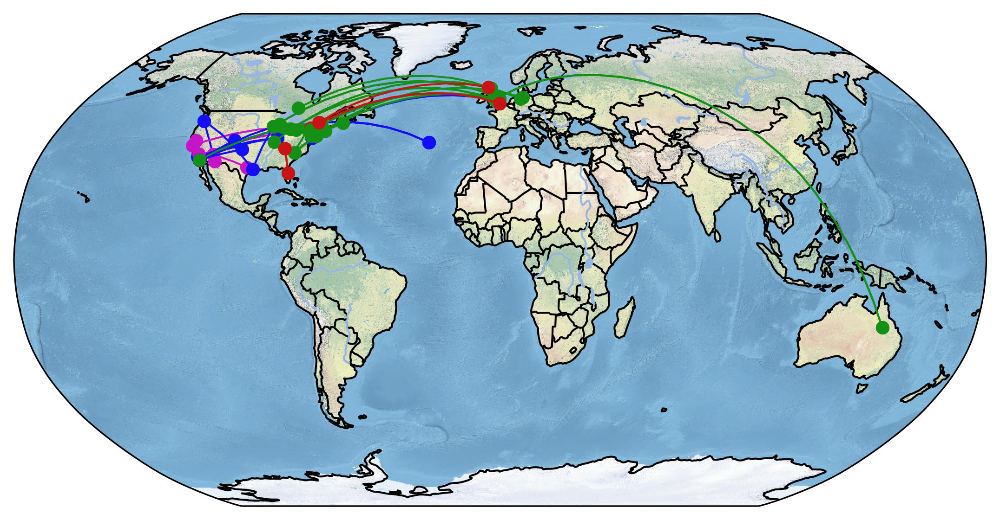

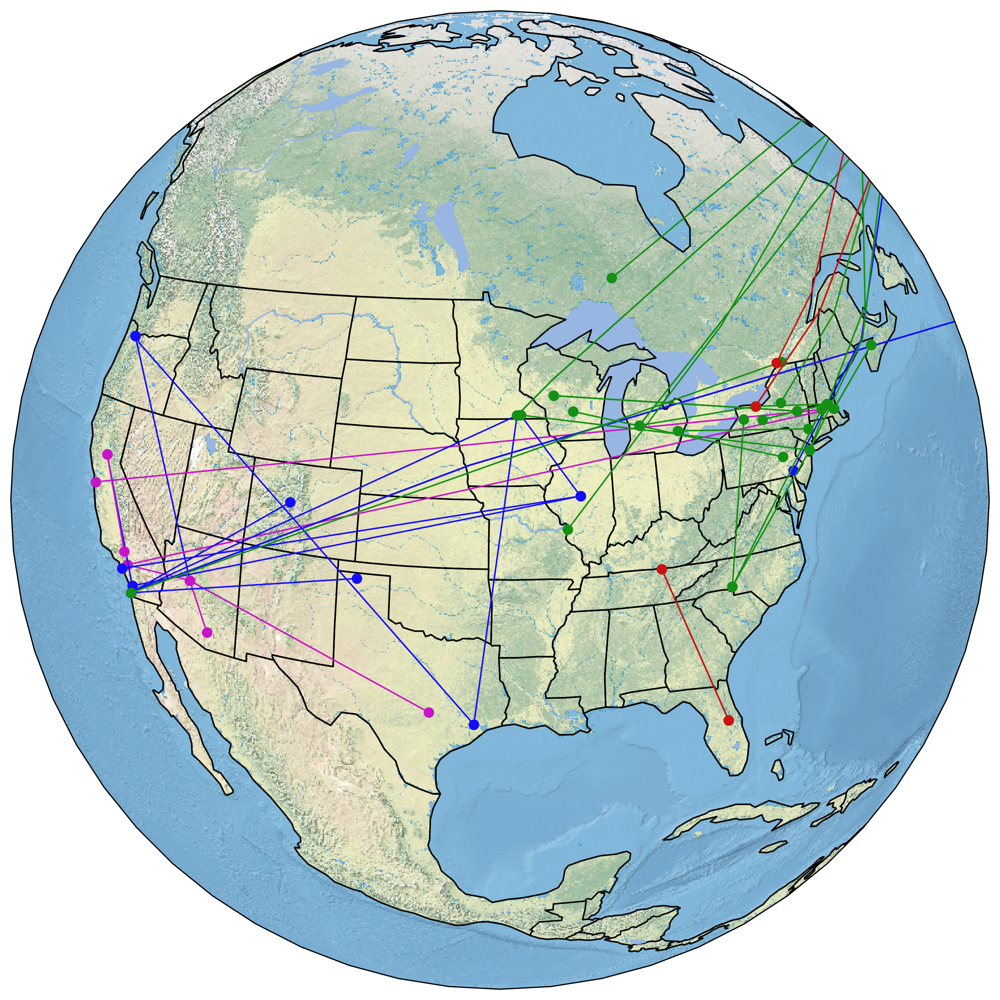

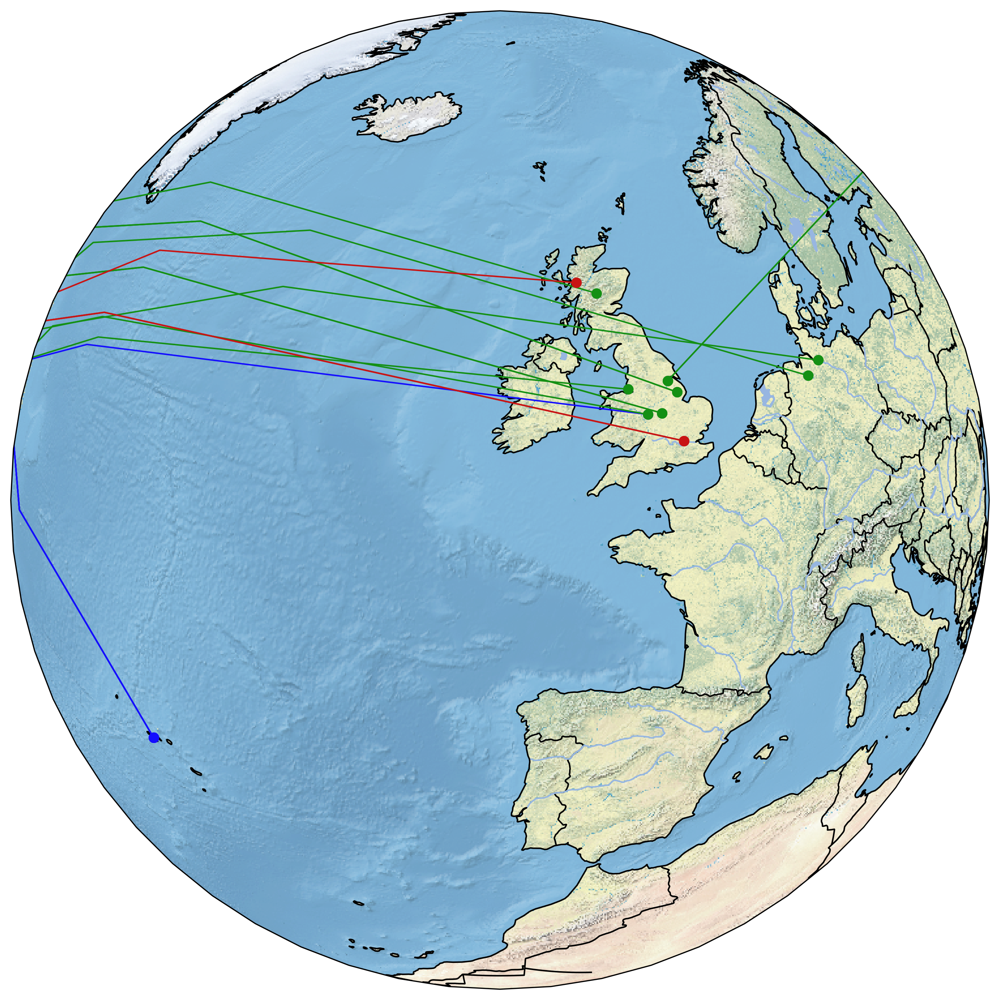

In [14]:
#########################################
# Create Maps with Movement Data plotted
#########################################

# I have selected 3 different map projections to use to show my personal ancestral movement data
# 1. a full world map (Robinson projection)
# 2. a USA centered map (Nearside perspective projection with custom satellite height set according to what looked good)
# 3. a Europe centered map (Nearside perspective projection with custom satellite height set according to what looked good)

# I show movement from different centuries as different colored lines, showing the same lines on all 3 maps.
# The USA and Europe maps are meant to zoom in on more detail where the main movements occurred. 

#year colors
c1700 = [1,0,0]
c1800 = [0,1,0]
c1900 = [0,0,1]
c2000 = [1,0,1]

c1700 = [200/255,20/255,20/255]
c1800 = [20/255,200/355,20/255]#[55/255,126/355,184/255]
c1900 = [20/255,20/355,200/200]#[20/255,200/255,20/255] #[77/255,175/255,74/255]
c2000 = [200/255,20/255,200/255]

#############full world map
fig = plt.figure(figsize=(9, 6),dpi=300)
ax = plt.axes(projection=ccrs.Robinson())

source_proj = ccrs.PlateCarree()

######Map background. 
# For quick loading, use the stock image line below
# ax.stock_img()


# For a higher quality background, download the full resolution file. (This takes MUCH longer to load, not recommended
# until you have finished troubleshooting code)
fname = 'NE1_HR_LC_SR_W_DR.tif'
ax.imshow(imread(fname), origin='upper', transform=source_proj, 
          extent=[-180, 180, -90, 90])

ax.add_feature(cfeature.BORDERS)
ax.add_feature(cfeature.LAKES)
ax.add_feature(cfeature.RIVERS)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.OCEAN)

# Transform the given lat/lon points into the Robinson projection
# geodetic = ccrs.Geodetic()
# robinson = ccrs.Robinson()

# Loop through ancestor movements and add lines to plot
for mov in movelist:
#     print(mov)
    lat1 = mov[0]
    lon1 = mov[1]
    lat2 = mov[2]
    lon2 = mov[3]
    year = mov[4]
    text = mov[5]
#     color = mov[6]
    if isinstance(year,str):
        year = int(year[len(year)-4:len(year)])
        if year<1000:
            year = mov[4]
            year = int(year[len(year)-5:len(year)-1])
    if year <= 1800:
        color = c1700
    elif year > 1800 and year <= 1900:
        color = c1800
    elif year > 1900 and year <= 2000:
        color = c1900
    elif year > 2000:
        color = c2000
    
    plt.plot([lon1,lon2],[lat1,lat2],color=color,linewidth=1,marker='o',transform=ccrs.Geodetic())
    
plt.savefig('worldmap.png',dpi=300,bbox_inches='tight')
plt.show()




#############USA Map
plt.figure(figsize=(12, 12),dpi=300)
ax = plt.axes(projection=ccrs.NearsidePerspective(central_longitude=-94.0, central_latitude=40.0,satellite_height=2000000))
source_proj = ccrs.PlateCarree()

# Same notes here as with world map above on loading stock vs. high quality image background
# ax.stock_img()
fname = 'NE1_HR_LC_SR_W_DR.tif'
ax.imshow(imread(fname), origin='upper', transform=source_proj, 
          extent=[-180, 180, -90, 90])


ax.add_feature(cfeature.BORDERS)
ax.add_feature(cfeature.LAKES)
ax.add_feature(cfeature.RIVERS)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.STATES)
# ax.add_feature(cfeature.NaturalEarthFeature(
#     'cultural', 'admin_1_states_provinces_lines', resolution,
#     edgecolor='gray', facecolor='none'))

# Transform the given lat/lon points into the Robinson projection
geodetic = ccrs.Geodetic()
robinson = ccrs.Robinson()

for mov in movelist:
#     print(mov)
    lat1 = mov[0]
    lon1 = mov[1]
    lat2 = mov[2]
    lon2 = mov[3]
    year = mov[4]
    text = mov[5]
#     color = mov[6]
    if isinstance(year,str):
        year = int(year[len(year)-4:len(year)])
        if year<1000:
            year = mov[4]
            year = int(year[len(year)-5:len(year)-1])
    if year <= 1800:
        color = c1700
        if (lon1 > 15 and lat1<50) or (lon2>15 and lat2<50):
#             print(move[10])
            print(mov[9],mov[10],lat1,lon1,lat2,lon2)
    elif year > 1800 and year <= 1900:
        color = c1800
    elif year > 1900 and year <= 2000:
        color = c1900
    elif year > 2000:
        color = c2000
    
    plt.plot([lon1,lon2],[lat1,lat2],color=color,linewidth=1,marker='o',transform=ccrs.Geodetic())
plt.savefig('usamap.png',dpi=300,bbox_inches='tight')
# plt.show()

#############Europe Map
plt.figure(figsize=(12, 12),dpi=300)
ax = plt.axes(projection=ccrs.NearsidePerspective(central_longitude=-10, central_latitude=50.0,satellite_height=1000000))
source_proj = ccrs.PlateCarree()
fname = 'NE1_HR_LC_SR_W_DR.tif'
ax.imshow(imread(fname), origin='upper', transform=source_proj, 
          extent=[-180, 180, -90, 90])
# ax.stock_img()
ax.add_feature(cfeature.BORDERS)
ax.add_feature(cfeature.LAKES)
ax.add_feature(cfeature.RIVERS)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.STATES)
# ax.add_feature(cfeature.NaturalEarthFeature(
#     'cultural', 'admin_1_states_provinces_lines', resolution,
#     edgecolor='gray', facecolor='none'))

# Transform the given lat/lon points into the Robinson projection
geodetic = ccrs.Geodetic()
robinson = ccrs.Robinson()

for mov in movelist:
#     print(mov)
    lat1 = mov[0]
    lon1 = mov[1]
    lat2 = mov[2]
    lon2 = mov[3]
    year = mov[4]
    text = mov[5]
#     color = mov[6]
    if isinstance(year,str):
        year = int(year[len(year)-4:len(year)])
        if year<1000:
            year = mov[4]
            year = int(year[len(year)-5:len(year)-1])
    if year <= 1800:
        color = c1700
    elif year > 1800 and year <= 1900:
        color = c1800
    elif year > 1900 and year <= 2000:
        color = c1900
    elif year > 2000:
        color = c2000
    
    plt.plot([lon1,lon2],[lat1,lat2],color=color,linewidth=1,marker='o',transform=ccrs.Geodetic())
plt.savefig('europemap.png',dpi=300,bbox_inches='tight')
plt.show()

In [15]:
#####################################
#Annotate ancestor locations on map
#####################################

# I placed some annotations of high level ancestor last names on my europe map to show where they originated from

im2 = Image.open('europemap.png')
d = ImageDraw.Draw(im2)

#get list of names for map annotation
ma = config.map_annote1

fnt = ImageFont.truetype(fontfile, 250)
acolor = (200,200,20)

xl=450
yl=2000
ds = 75 #dotsize
d.ellipse([(xl,yl),(xl+ds,yl+ds)],fill=acolor,outline=(0,0,0),width=2)
d.text((xl+ds+25,yl+ds/2), ma[0], font=fnt, fill=acolor, stroke_width=2, stroke_fill=(0,0,0),align='left', anchor='lm')

xl=1650
yl=750
d.ellipse([(xl,yl),(xl+ds,yl+ds)],fill=acolor,outline=(0,0,0),width=2)
d.text((xl+ds+25,yl+ds/2), ma[1], font=fnt, fill=acolor,stroke_width=2, stroke_fill=(0,0,0), align='left', anchor='lm')

xl=1670
yl=1140
d.ellipse([(xl,yl),(xl+ds,yl+ds)],fill=acolor,outline=(0,0,0),width=2)
d.text((xl-fnt.getsize(ma[2])[0]-25,yl+ds/2), ma[2], font=fnt, fill=acolor,stroke_width=2, stroke_fill=(0,0,0), align='left', anchor='lm')

xl=1770
yl=1090
d.ellipse([(xl,yl),(xl+ds,yl+ds)],fill=acolor,outline=(0,0,0),width=2)
d.text((xl-fnt.getsize(ma[3])[0]-5,yl-90), ma[3], font=fnt, fill=acolor,stroke_width=2, stroke_fill=(0,0,0), align='left', anchor='lm')

xl=1880
yl=1050
d.ellipse([(xl,yl),(xl+ds,yl+ds)],fill=acolor,outline=(0,0,0),width=2)
d.text((xl+ds+25,yl+ds/2), ma[4], font=fnt, fill=acolor,stroke_width=2, stroke_fill=(0,0,0), align='left', anchor='lm')

xl=1770
yl=1250
d.ellipse([(xl,yl),(xl+ds,yl+ds)],fill=acolor,outline=(0,0,0),width=2)
d.text((xl-fnt.getsize(ma[5])[0]+50,yl+ds/2+150), ma[5], font=fnt, fill=acolor, stroke_width=2, stroke_fill=(0,0,0),align='left', anchor='lm')

im2.save('europemap_annotated.png')
im2.show()
im2.close

<bound method Image.close of <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=2778x2778 at 0x1CBD8D93408>>

# Add Charts to Family Tree Image

In [16]:
#############################
#Add charts to family tree
#############################

r = personsettings['r'] #resolution dpi
canvas_width = personsettings['canvas_width']
canvas_height = personsettings['canvas_height']
bottom_border = 1 # Note, this is different than my settings border because I left extra space in that border for these graphs
side_border = personsettings['side_border']

##open family tree to add charts to
filename = filedir + '\\familytree.png'
im = Image.open(filename)


# ###########add size scale box 3" x 3"
# pastepic = Image.open('sizetest.png') # Can be many different formats.
# pastepic = pastepic.resize((int(3*r),int(3*r)))
# xpos = 0
# ypos = 0
# im.paste(pastepic,(xpos,ypos),pastepic)

### Paste genetic ancestry pie chart
pastepic = Image.open('persongeneticpie.png') 
w,h = pastepic.size
ph = 3.5 #inches, picture height
pastepic = pastepic.resize((int(ph*r*w/h),int(ph*r)))
xpos = int((side_border)*r)
ypos = int((canvas_height-(ph+bottom_border))*r)
im.paste(pastepic,(xpos,ypos),pastepic)


### Paste country of birth ancestry ring chart
pastepic = Image.open('ancbirthpie.png') 
w,h = pastepic.size
ph = 2.75 #inches, picture height
cs = 8 #space from center canvas
pastepic = pastepic.resize((int(ph*r*w/h),int(ph*r)))
w,h = pastepic.size
xpos = int((canvas_width/2 - cs)*r-w)
ypos = int((canvas_height-(ph+bottom_border))*r)
im.paste(pastepic,(xpos,ypos),pastepic)
# Title for image
d = ImageDraw.Draw(im)
fnt = ImageFont.truetype(fontfile, 100)
d.text(((canvas_width/2-cs)*r-w/2,(canvas_height-(ph+0.75+bottom_border))*r), 'Country of Birth by Generation', font=fnt, fill=textcolor, 
                          align='center', anchor='mt')

### Paste ancestor occupation ring chart
pastepic = Image.open('occupationpie.png') 
w,h = pastepic.size
ph = 2.75 #inches, picture height
pastepic = pastepic.resize((int(ph*r*w/h),int(ph*r)))
w,h = pastepic.size
xpos = int((canvas_width/2 + cs)*r)
ypos = int((canvas_height-(ph+bottom_border))*r)
im.paste(pastepic,(xpos,ypos),pastepic)
# Title for image
d = ImageDraw.Draw(im)
fnt = ImageFont.truetype(fontfile, 100)
d.text(((canvas_width/2 + cs)*r+w/2,(canvas_height-(ph+0.75+bottom_border))*r), 'Occupation by Generation', font=fnt, fill=textcolor, 
                          align='center', anchor='mt')

### Paste ancestor years lived ring chart
pastepic = Image.open('yearslivedpie.png')
w,h = pastepic.size
ph = 2.75 #inches, picture height
pastepic = pastepic.resize((int(ph*r*w/h),int(ph*r)))
w,h = pastepic.size
xpos = int((canvas_width - side_border)*r-w)
ypos = int((canvas_height-(ph+bottom_border))*r)
im.paste(pastepic,(xpos,ypos),pastepic)

d = ImageDraw.Draw(im)
fnt = ImageFont.truetype(fontfile, 100)
d.text(((canvas_width - side_border)*r-w/2,(canvas_height-(ph+0.75+bottom_border))*r), 'Years Lived by Generation', font=fnt, fill=textcolor, 
                          align='center', anchor='mt')


###########Maps
ph = 3 #inches, picture height
wsp = 0.1 #spacing between
ph_world = 3 #inches, picture height

pastepic = Image.open('worldmap.png') # Can be many different formats.
w,h = pastepic.size
pastepic = pastepic.resize((int(ph_world*r*w/h),int(ph_world*r)))
w_world,h = pastepic.size
xpos = int((canvas_width/2)*r - w_world/2)
ypos = int((canvas_height-(ph_world+bottom_border+0.25))*r)
im.paste(pastepic,(xpos,ypos),pastepic)

pastepic = Image.open('europemap_annotated.png') # Can be many different formats.
w,h = pastepic.size
pastepic = pastepic.resize((int(ph*r*w/h),int(ph*r)))
w,h = pastepic.size
xpos = int((canvas_width/2)*r + w_world/2 + wsp*r)
ypos = int((canvas_height-(ph_world+bottom_border+0.25))*r)
im.paste(pastepic,(xpos,ypos),pastepic)

pastepic = Image.open('usamap.png') # Can be many different formats.
w,h = pastepic.size
pastepic = pastepic.resize((int(ph*r*w/h),int(ph*r)))
w,h = pastepic.size
xpos = int((canvas_width/2)*r - w_world/2 - w - wsp*r)
ypos = int((canvas_height-(ph_world+bottom_border+0.25))*r)
im.paste(pastepic,(xpos,ypos),pastepic)



#map key
bw = 50 #box width
bh = 50 #box height
x1 = int(canvas_width/2*r - w_world/4)
x2 = int(canvas_width/2*r - w_world/8)
x3 = int(canvas_width/2*r)
x4 = int(canvas_width/2*r + w_world/8)
y = int((canvas_height-(bottom_border+0.25))*r+(0.25*r-bh))
textoffset = 10

print(x1,x2,x3,x4,y)

c1700c = (int(c1700[0]*255),int(c1700[1]*255),int(c1700[2]*255))
c1800c = (int(c1800[0]*255),int(c1800[1]*255),int(c1800[2]*255))
c1900c = (int(c1900[0]*255),int(c1900[1]*255),int(c1900[2]*255))
c2000c = (int(c2000[0]*255),int(c2000[1]*255),int(c2000[2]*255))
fnt = ImageFont.truetype(fontfile, 50)

d.rectangle([(x1,y),(x1+bw,y+bh)],fill=c1700c,outline=(0,0,0),width=1)
d.text((x1+bw+textoffset,y+bh/2), '1700s', font=fnt, fill=textcolor, align='left', anchor='lm')

d.rectangle([(x2,y),(x2+bw,y+bh)],fill=c1800c,outline=(0,0,0),width=1)
d.text((x2+bw+textoffset,y+bh/2), '1800s', font=fnt, fill=textcolor, align='left', anchor='lm')

d.rectangle([(x3,y),(x3+bw,y+bh)],fill=c1900c,outline=(0,0,0),width=1)
d.text((x3+bw+textoffset,y+bh/2), '1900s', font=fnt, fill=textcolor, align='left', anchor='lm')

d.rectangle([(x4,y),(x4+bw,y+bh)],fill=c2000c,outline=(0,0,0),width=1)
d.text((x4+bw+textoffset,y+bh/2), '2000s', font=fnt, fill=textcolor, align='left', anchor='lm')

im.save('examplefamilytree_withgraphics.png')
im.show()

5568 5784 6000 6215 5650
